In [5]:
!pwd

/home/yuri/github.com/AoesJP/project_pokereader/notebooks/yuri_workspace


In [8]:
import os
import sys

sys.path.append("/home/yuri/github.com/AoesJP/project_pokereader/pokereader_deploy")
sys.path

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import cv2
import pickle
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import splprep, splev

In [10]:
from pokedex.edges import deformer, draw
from pokedex import HIRES_HEIGHT, HIRES_WIDTH

In [11]:
np.array([[1, 2, 3], [4, 2, 5], [5, 4, 2], [5, 2, 3]]) * np.array([1, -1, 0, 1]).reshape(4, 1)

array([[ 1,  2,  3],
       [-4, -2, -5],
       [ 0,  0,  0],
       [ 5,  2,  3]])

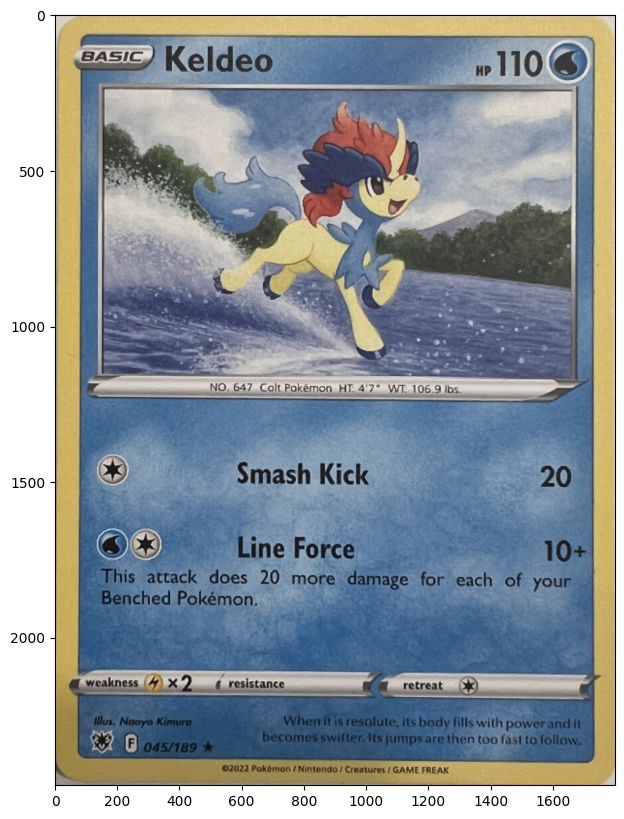

In [14]:
img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/white_bg/IMG_1488.jpeg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/white_bg/IMG_1498.jpeg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/white_bg/swsh12pt5-62.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/white_bg/dv1-2.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/white_bg/charizard2.png"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/white_bg/pika.jpeg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/poke1.png"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/poke2.png"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240523_211006.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240523_210824.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240520_122513.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240523_222811.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240523_222803.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240526_235214.jpg"
# img_path = "/home/yuri/github.com/AoesJP/project_pokereader/data/home/20240526_235233.jpg"
test_img = Image.open(img_path)
# plt.imshow(np.flip(np.array(test_img).transpose(1, 0, 2), axis=1))
# plt.imshow(np.array(test_img))
# img, deformed_img = deformer.deform_card(test_img)
deformed_img = deformer.deform_card(test_img)
# deformed_img = deformer.deform_card(img_path)
# draw.show_color(test_img)
draw.show_color(deformed_img)
# draw.draw_lines(img, deformed_img)

In [15]:
np.sign(np.array([-3.2]))

array([-1.])

In [16]:
img_file = Image.open(img_path)
img_file = ImageOps.exif_transpose(img_file)
# img_file = cv2.imread(img_path)
converted_img = np.array(img_file)[:, :, :3]

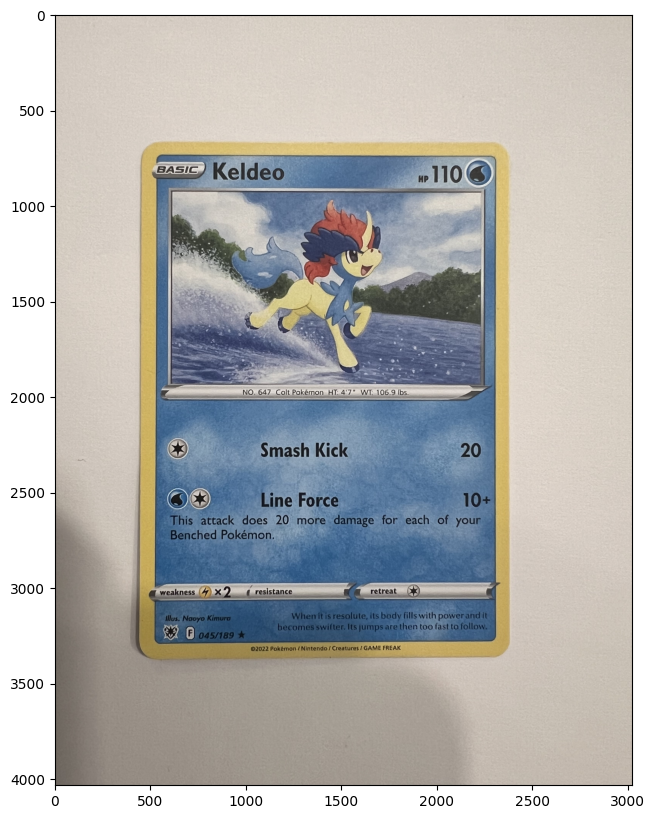

In [27]:
plt.figure(figsize=(10, 10))
plt.imshow(converted_img)

In [20]:
converted_img.shape, converted_img.dtype

((4032, 3024, 3), dtype('uint8'))

In [21]:
output_shape: tuple[int, int] = (HIRES_WIDTH, HIRES_HEIGHT)

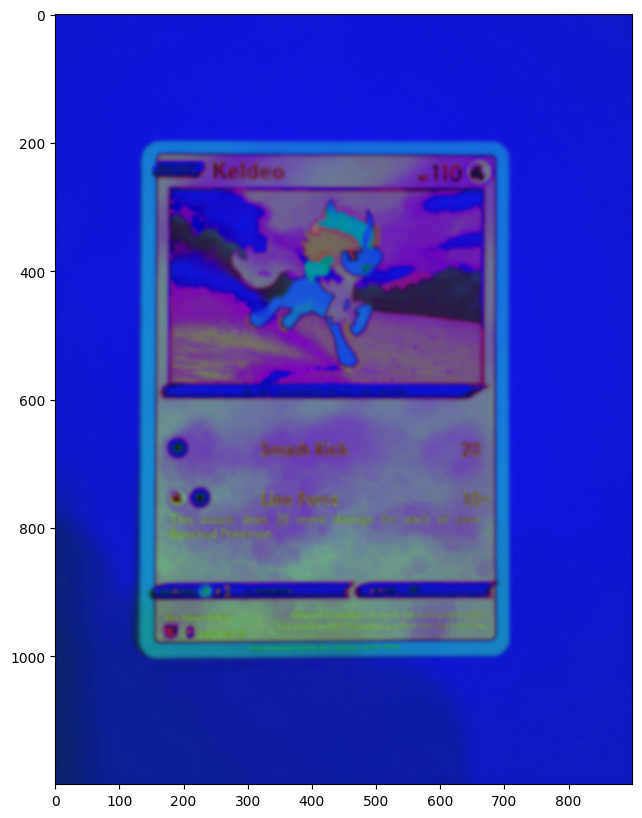

In [26]:
loaded_shape = converted_img.shape[:2]
max_length = max(loaded_shape)
MAX_EDGE_LENGTH = 1200
edge_scale_ratio = MAX_EDGE_LENGTH / max_length
IMG_SIZE = (int(loaded_shape[1] * edge_scale_ratio), int(loaded_shape[0] * edge_scale_ratio))
# img = resize_with_fill(cv2.cvtColor(np.array(img_file), cv2.COLOR_BGR2RGB), IMG_SIZE[0], IMG_SIZE[1])
# img = cv2.resize(cv2.cvtColor(converted_img, cv2.COLOR_BGR2RGB), IMG_SIZE[0], IMG_SIZE[1])
img = cv2.resize(converted_img, IMG_SIZE)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
blur_ammount = 13
blurred_rgb = cv2.GaussianBlur(img, (blur_ammount, blur_ammount), 0)
blurred_hsv = cv2.GaussianBlur(img_hsv, (blur_ammount, blur_ammount), 0)
# morph_kernel = (7, 7)
# blurred_rgb = cv2.morphologyEx(blurred_rgb, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize=morph_kernel), iterations=2)
# blurred_hsv = cv2.morphologyEx(blurred_hsv, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize=morph_kernel), iterations=2)
# blurred_rgb = cv2.GaussianBlur(blurred_rgb, (blur_ammount, blur_ammount), 0)
# blurred_hsv = cv2.GaussianBlur(blurred_hsv, (blur_ammount, blur_ammount), 0)
plt.figure(figsize=(10, 10))
plt.imshow(blurred_hsv)

In [28]:
alpha = 1.5
beta = -50
img_r = deformer.apply_contrast(blurred_rgb[:, :, 0], alpha=alpha, beta=beta)
img_g = deformer.apply_contrast(blurred_rgb[:, :, 1], alpha=alpha, beta=beta)
img_b = deformer.apply_contrast(blurred_rgb[:, :, 2], alpha=alpha, beta=beta)
img_h = deformer.apply_contrast(blurred_hsv[:, :, 0], alpha=alpha, beta=beta)
img_s = deformer.apply_contrast(blurred_hsv[:, :, 1], alpha=alpha, beta=beta)
img_v = deformer.apply_contrast(blurred_hsv[:, :, 2], alpha=alpha, beta=beta)
edge_mono = cv2.cvtColor(deformer.mono_grad(blurred_rgb, 3), cv2.COLOR_BGR2GRAY)
canney_min = 50
canney_max = 150
edger = deformer.expand_edges(cv2.Canny(img_r, canney_min, canney_max))
edgeg = deformer.expand_edges(cv2.Canny(img_g, canney_min, canney_max))
edgeb = deformer.expand_edges(cv2.Canny(img_b, canney_min, canney_max))
edge1 = deformer.expand_edges(cv2.Canny(img_h, canney_min, canney_max))
edge2 = deformer.expand_edges(cv2.Canny(img_s, canney_min, canney_max))
edge3 = deformer.expand_edges(cv2.Canny(img_v, canney_min, canney_max))
# edge_all = cv2.max(cv2.max(edge1, edge2), edge3)

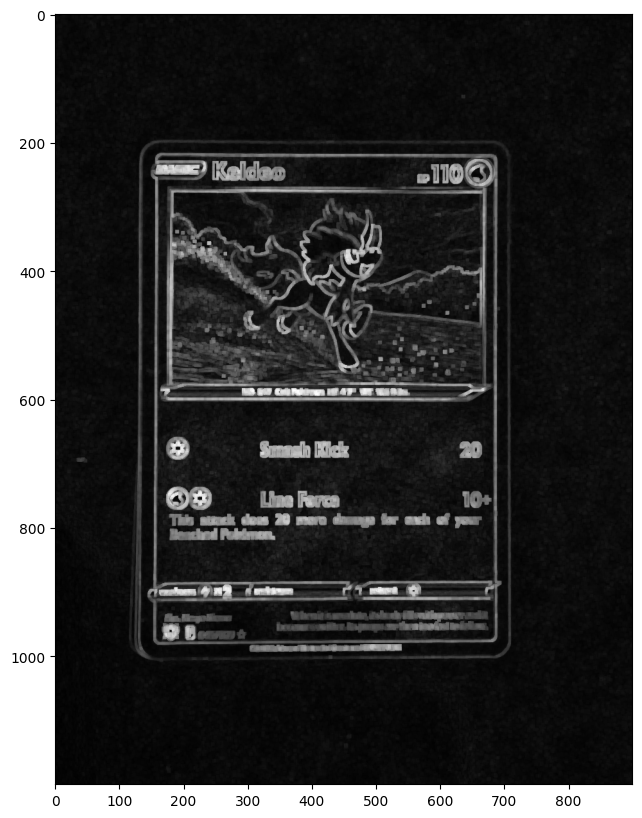

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(cv2.morphologyEx(cv2.cvtColor(deformer.mono_grad(img, 5), cv2.COLOR_BGR2GRAY), cv2.MORPH_OPEN, (31, 31)), cmap="grey")

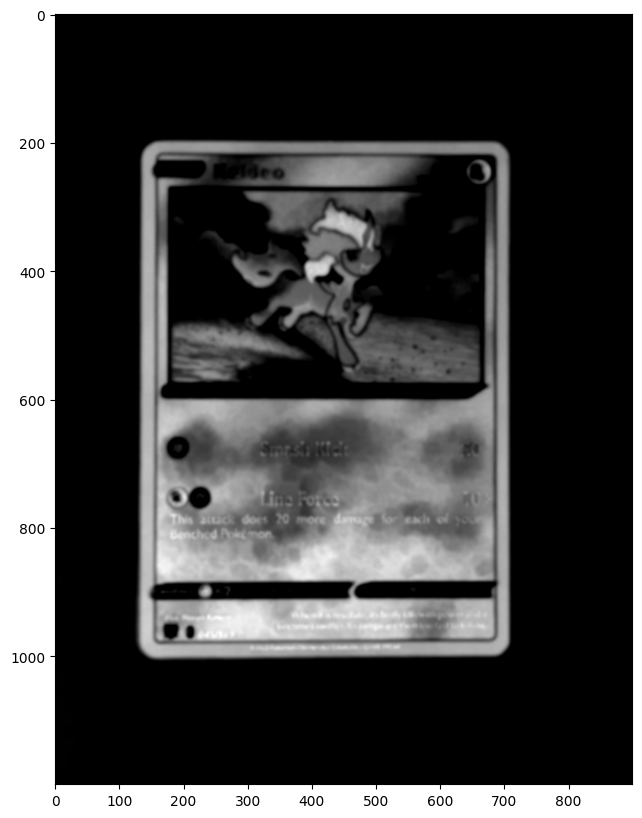

In [32]:
plt.figure(figsize=(10, 10))
plt.imshow(img_s, cmap="grey")

<Figure size 1000x1000 with 0 Axes>

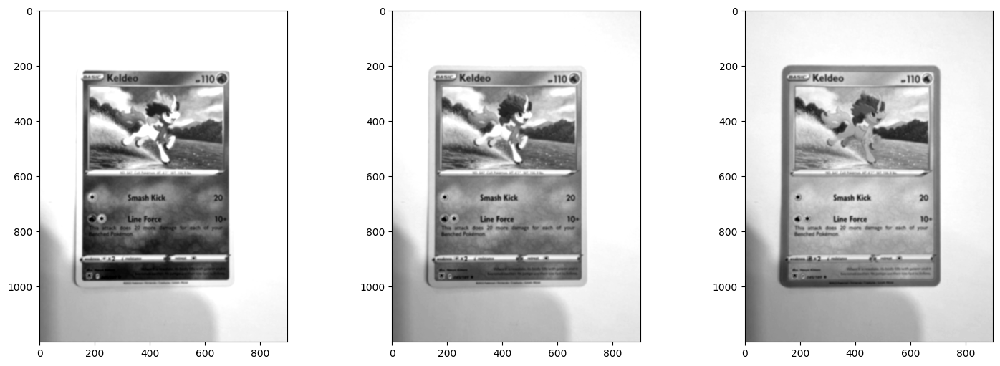

In [33]:
draw.show_channels(np.stack([img_r, img_g, img_b], axis=2))

In [34]:
canney_min = 50
canney_max = 150
edger = deformer.expand_edges(cv2.Canny(img_r, canney_min, canney_max))
edgeg = deformer.expand_edges(cv2.Canny(img_g, canney_min, canney_max))
edgeb = deformer.expand_edges(cv2.Canny(img_b, canney_min, canney_max))

<Figure size 1000x1000 with 0 Axes>

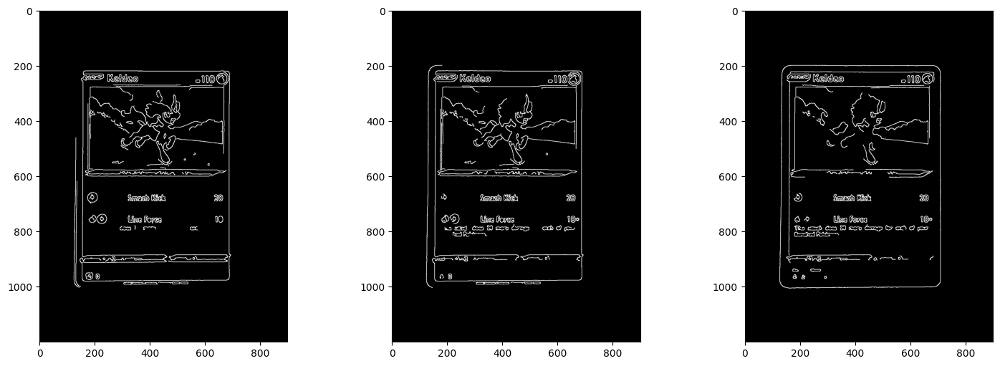

In [35]:
# kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize=(13, 13))
draw.show_channels(np.stack([edger, edgeg, edgeb], axis=2))

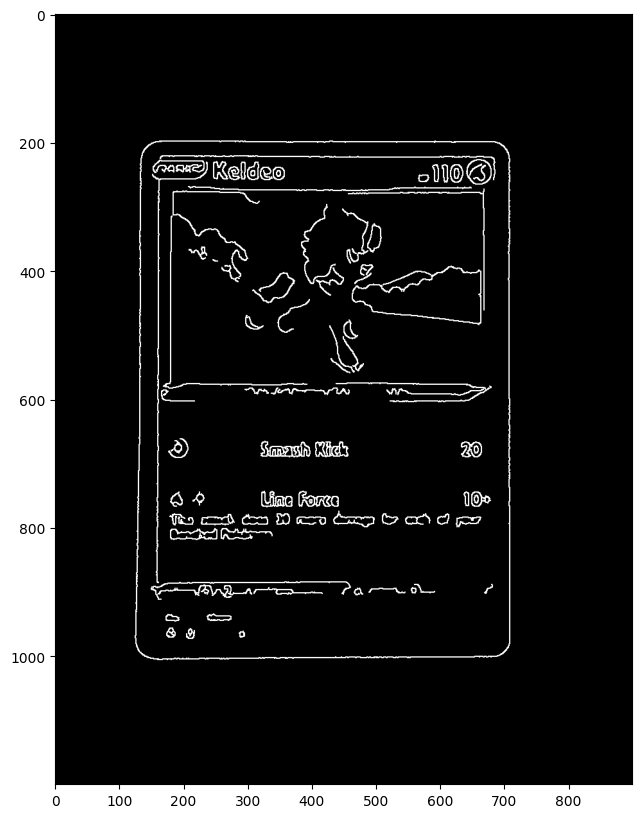

In [37]:
plt.figure(figsize=(10, 10))
plt.imshow(edgeb, cmap="grey")

In [36]:
# img_patten = cv2.cvtColor(cv2.imread("/home/yuri/github.com/AoesJP/project_pokereader/data/card_framing3.png"), cv2.COLOR_BGR2GRAY)
# akaze = cv2.AKAZE_create()
# kp1, des1 = akaze.detectAndCompute(img_patten, None)
# kp2, des2 = akaze.detectAndCompute(edgeg, None)

In [2127]:
# bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# matches = bf.match(des1, des2)

# # 特徴点間のハミング距離でソート
# matches = sorted(matches, key=lambda x: x.distance)

# # 2画像間のマッチング結果画像を作成
# img1_2 = cv2.drawMatches(img_patten, kp1, edgeg, kp2, matches[:10], None, flags=2)
# plt.imshow(img1_2)

In [2128]:
# with open("/home/yuri/github.com/AoesJP/project_pokereader/data/cnt_avg_all.pickle", mode="rb") as f:
#     cnt_avg_all = pickle.load(f).astype("uint8")

# plt.imshow(cnt_avg_all)

In [2129]:
# tuple((np.array(cnt_avg_all.shape) * 0.5).astype("uint32"))

In [38]:
# template = cv2.resize(cnt_avg_all, tuple((np.array(cnt_avg_all.shape) * 0.7).astype("uint32")))

# w, h = template.shape
# w

# result = cv2.matchTemplate(edge_mono, template, cv2.TM_CCORR_NORMED)
# # 検索結果の信頼度と位置座標の取得
# min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

# top_left = max_loc

# # 検索結果の右下頂点の座標を取得
# bottom_right = (top_left[0] + w, top_left[1] + h)

# # 検索対象画像内に、検索結果を長方形で描画
# edge_mono_copy = edge_mono.copy()
# cv2.rectangle(edge_mono_copy, top_left, bottom_right, (255, 255, 0), 2)

# # 画像を表示
# plt.imshow(edge_mono_copy)

<Figure size 1000x1000 with 0 Axes>

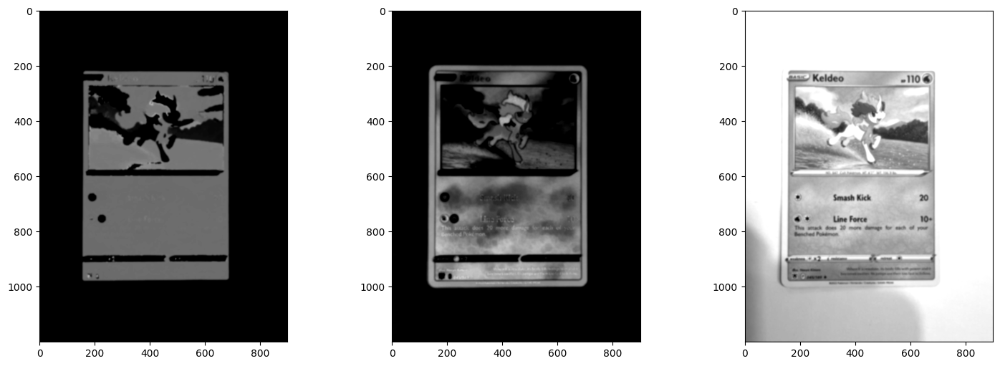

In [39]:
draw.show_channels(np.stack([img_h, img_s, img_v], axis=2))

<Figure size 1000x1000 with 0 Axes>

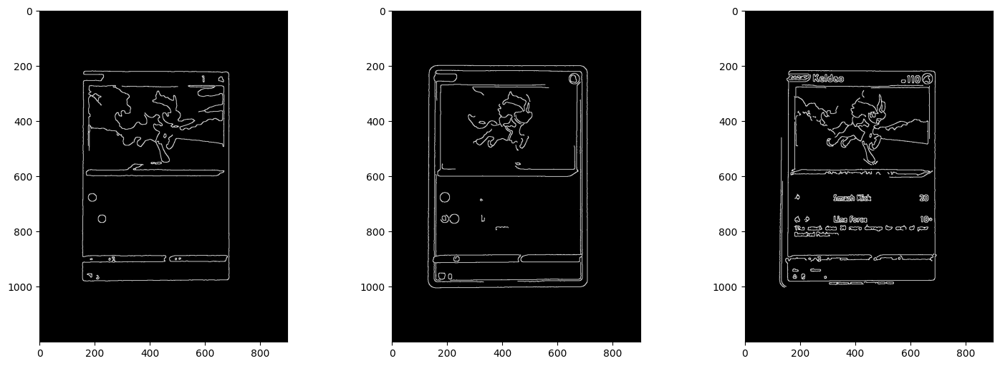

In [40]:
draw.show_channels(np.stack([edge1, edge2, edge3], axis=2))

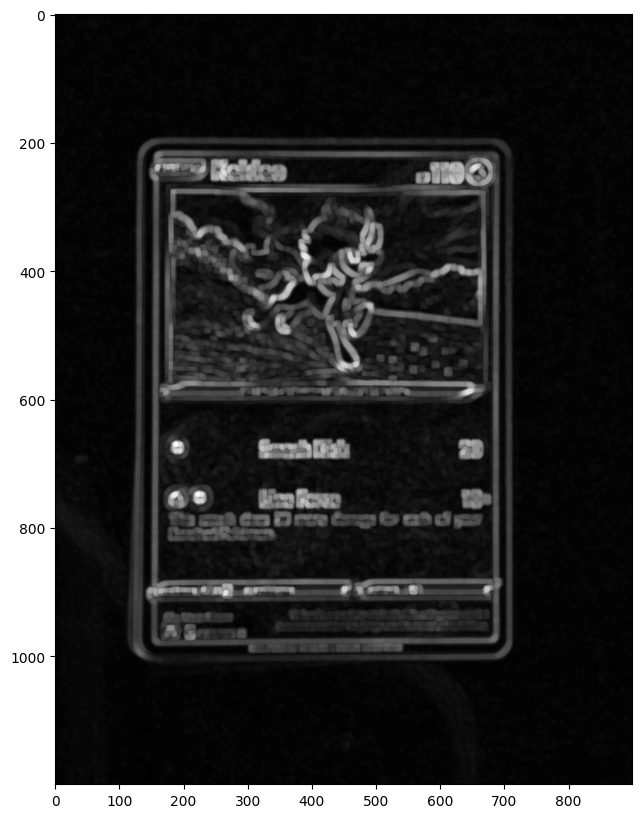

In [44]:
plt.figure(figsize=(10, 10))
plt.imshow(deformer.expand_edges(edge_mono, kernel=(5, 5)), cmap="grey")

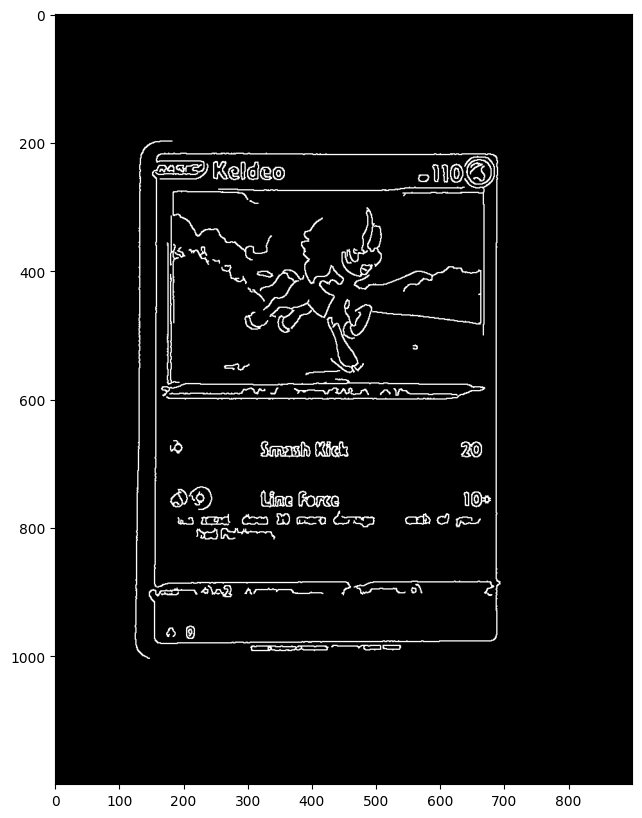

In [45]:
plt.figure(figsize=(10, 10))
plt.imshow(edgeg, cmap="grey")

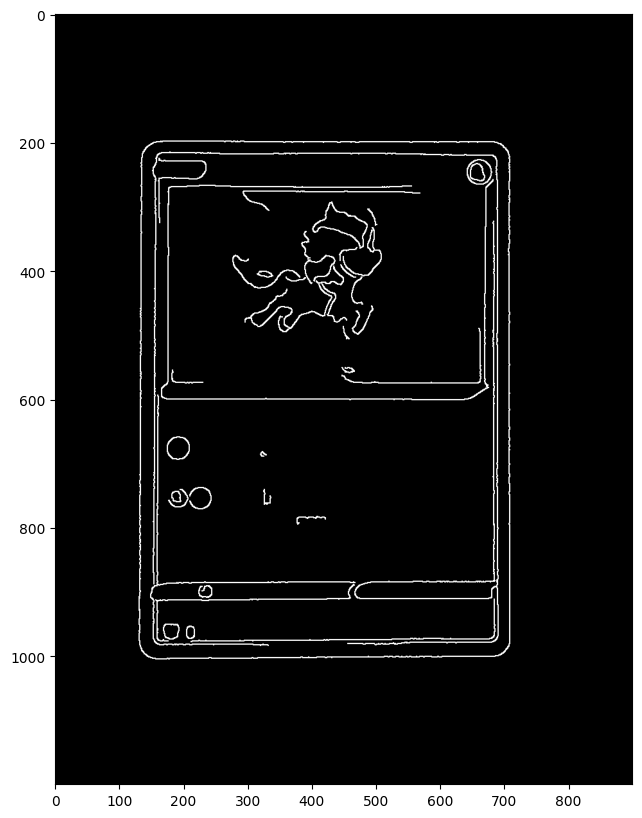

In [46]:
plt.figure(figsize=(10, 10))
plt.imshow(edge2, cmap="grey")

In [47]:
IMG_SIZE

(900, 1200)

In [48]:
edger.shape, edger.dtype

((1200, 900), dtype('uint8'))

In [49]:
edge_mono.shape, edge_mono.dtype

((1200, 900), dtype('uint8'))

In [50]:
img.shape, img.dtype

((1200, 900, 3), dtype('uint8'))

In [51]:
IMG_SIZE

(900, 1200)

In [52]:
# contours, hierarchy = cv2.findContours(edge_all, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all = []
contours, hierarchy = cv2.findContours(edger, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))
contours, hierarchy = cv2.findContours(edgeg, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))
contours, hierarchy = cv2.findContours(edgeb, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))
contours, hierarchy = cv2.findContours(edge1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))
contours, hierarchy = cv2.findContours(edge2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))
contours, hierarchy = cv2.findContours(edge3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))
contours, hierarchy = cv2.findContours(edge_mono, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
contours_all.extend(list(deformer.remove_short_long_contours(contours, IMG_SIZE, min_length=300)))

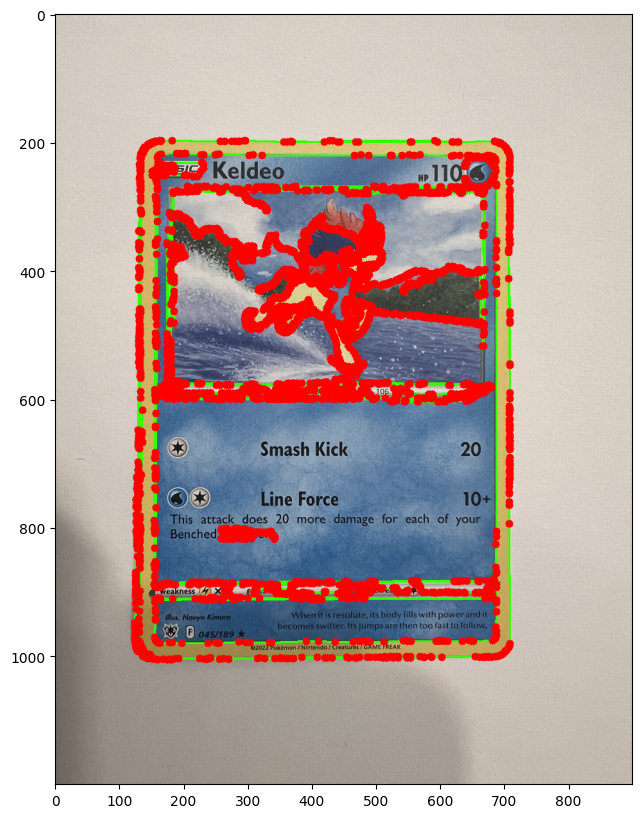

In [57]:
plt.figure(figsize=(10, 10))
draw.draw_contours(img, contours_all)

In [58]:
cnt_smoothed = deformer.smooth_contours(contours_all)
cnt_smoothed

[array([[[466, 908]],
 
        [[468, 909]],
 
        [[471, 910]],
 
        [[481, 911]],
 
        [[670, 911]],
 
        [[677, 910]],
 
        [[681, 908]],
 
        [[681, 905]],
 
        [[679, 905]],
 
        [[676, 904]],
 
        [[674, 902]],
 
        [[673, 902]],
 
        [[672, 899]],
 
        [[673, 897]],
 
        [[675, 895]],
 
        [[678, 895]],
 
        [[681, 894]],
 
        [[683, 891]],
 
        [[679, 886]],
 
        [[679, 885]],
 
        [[562, 883]],
 
        [[558, 883]],
 
        [[493, 884]],
 
        [[489, 885]],
 
        [[484, 888]],
 
        [[481, 889]],
 
        [[477, 890]],
 
        [[474, 889]],
 
        [[471, 890]],
 
        [[469, 891]],
 
        [[470, 893]],
 
        [[469, 895]],
 
        [[472, 895]],
 
        [[475, 898]],
 
        [[475, 902]],
 
        [[477, 904]],
 
        [[479, 904]],
 
        [[480, 902]],
 
        [[489, 902]],
 
        [[491, 901]],
 
        [[492, 898]],
 
        [[494, 8

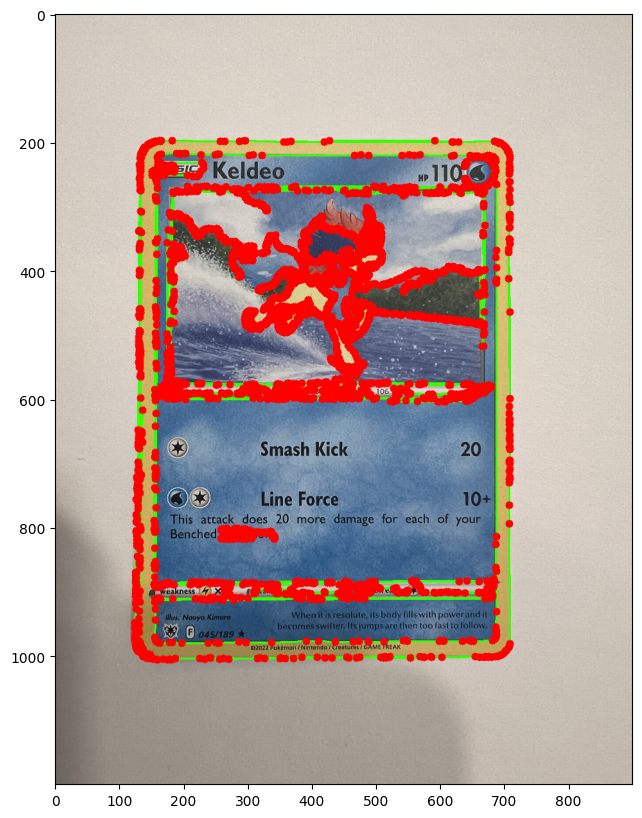

In [61]:
plt.figure(figsize=(10, 10))
draw.draw_contours(img, cnt_smoothed)

In [62]:
found_contours = deformer.find_rectangle_contours(cnt_smoothed, deformer.base_contour, threshold=0.3)
if not len(found_contours) > 0:
    deformer.logger.warning("No contour was found. Exiting.")
    print(cv2.resize(converted_img, output_shape))

In [63]:
found_contours

[[array([[[ 145,  203]],
  
         [[ 138,  210]],
  
         [[ 135,  216]],
  
         [[ 133,  224]],
  
         [[ 132,  233]],
  
         [[ 132,  235]],
  
         [[ 133,  236]],
  
         [[ 133,  238]],
  
         [[ 132,  239]],
  
         [[ 132,  241]],
  
         [[ 133,  242]],
  
         [[ 133,  271]],
  
         [[ 131,  337]],
  
         [[ 132,  357]],
  
         [[ 132,  360]],
  
         [[ 131,  367]],
  
         [[ 131,  399]],
  
         [[ 132,  400]],
  
         [[ 132,  402]],
  
         [[ 131,  407]],
  
         [[ 131,  460]],
  
         [[ 132,  468]],
  
         [[ 132,  517]],
  
         [[ 131,  530]],
  
         [[ 132,  547]],
  
         [[ 132,  551]],
  
         [[ 130,  659]],
  
         [[ 130,  661]],
  
         [[ 131,  669]],
  
         [[ 129,  711]],
  
         [[ 128,  752]],
  
         [[ 128,  754]],
  
         [[ 129,  758]],
  
         [[ 128,  759]],
  
         [[ 129,  766]],
  
         [[ 129,  77

In [64]:
len(found_contours)

3

In [65]:
draw.draw_contour(img, found_contours[150][0])

IndexError: list index out of range

In [66]:
best_fit_contour = found_contours[0][0]
best_fit_contour = deformer.reset_orientation(best_fit_contour)
# best_fit_contour_convex = cv2.convexHull(best_fit_contour)
best_fit_contour = deformer.remove_flat_points(best_fit_contour, threshold=2)

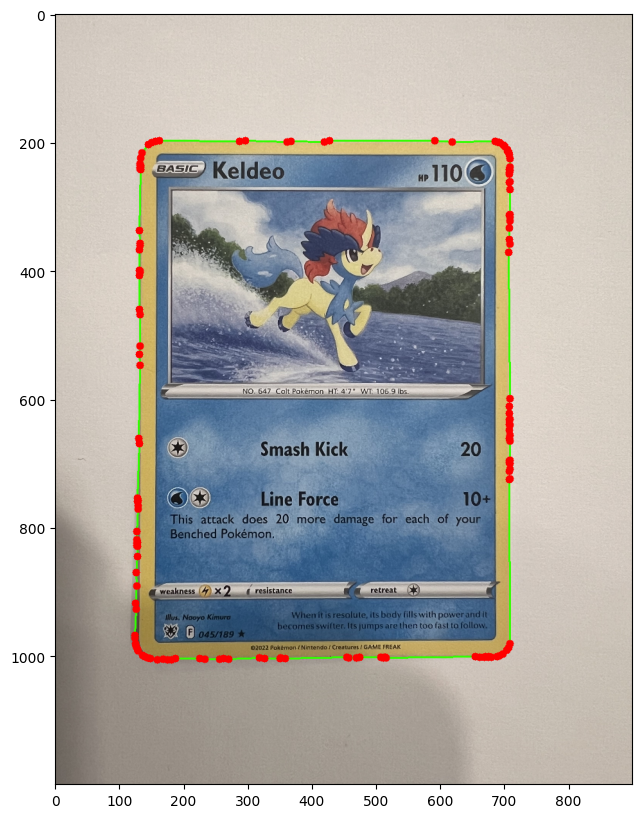

In [70]:
plt.figure(figsize=(10, 10))
draw.draw_contour(img, best_fit_contour)

In [71]:
best_fit_contour = deformer.remove_protrude(img, best_fit_contour)

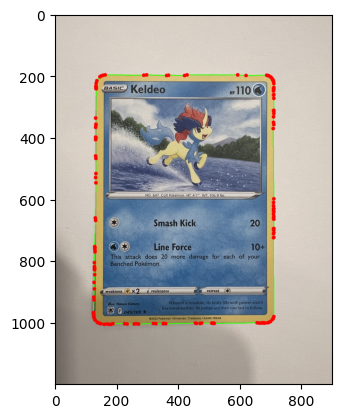

In [72]:
draw.draw_contour(img, best_fit_contour)

In [73]:
contour_image = np.zeros_like(img[:, :, 0])
cv2.drawContours(contour_image, [best_fit_contour], -1, (255), 1)
lines = cv2.HoughLines(contour_image, 1, np.pi / 180, 100)

In [74]:
lines

array([[[ 7.0700000e+02,  0.0000000e+00]],

       [[ 1.9700000e+02,  1.5707964e+00]],

       [[ 1.3100000e+02,  0.0000000e+00]],

       [[ 1.4200000e+02,  1.7453292e-02]],

       [[ 1.0100000e+03,  1.5533431e+00]],

       [[ 1.0020000e+03,  1.5707964e+00]],

       [[ 7.1300000e+02,  1.7453292e-02]],

       [[ 1.0120000e+03,  1.5533431e+00]],

       [[ 1.0040000e+03,  1.5707964e+00]],

       [[-6.9800000e+02,  3.1241393e+00]],

       [[ 1.3700000e+02,  1.7453292e-02]],

       [[ 2.0500000e+02,  1.5533431e+00]],

       [[ 7.2000000e+02,  1.7453292e-02]],

       [[ 1.8800000e+02,  1.5882496e+00]]], dtype=float32)

In [75]:
a = np.array([3, 2, -1, 0, -5])

In [76]:
a.mean()

-0.2

In [77]:
a_sign = 2 * (a >= 0).astype("int8") - 1
a * a_sign

array([3, 2, 1, 0, 5])

In [78]:
new_lines = deformer.calc_lines(lines)

In [79]:
new_lines

array([[ 1.0000000e+00,  0.0000000e+00, -7.0700000e+02],
       [-4.3711388e-08,  1.0000000e+00, -1.9700000e+02],
       [ 1.0000000e+00,  0.0000000e+00, -1.3100000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -1.4200000e+02],
       [ 1.7452383e-02,  9.9984771e-01, -1.0100000e+03],
       [-4.3711388e-08,  1.0000000e+00, -1.0020000e+03],
       [ 9.9984771e-01,  1.7452406e-02, -7.1300000e+02],
       [ 1.7452383e-02,  9.9984771e-01, -1.0120000e+03],
       [-4.3711388e-08,  1.0000000e+00, -1.0040000e+03],
       [-9.9984771e-01,  1.7452458e-02,  6.9800000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -1.3700000e+02],
       [ 1.7452383e-02,  9.9984771e-01, -2.0500000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -7.2000000e+02],
       [-1.7452350e-02,  9.9984771e-01, -1.8800000e+02]], dtype=float32)

In [80]:
test_lines = np.array(new_lines[new_lines[:, 0] > 0.9])
test_lines

array([[ 1.0000000e+00,  0.0000000e+00, -7.0700000e+02],
       [ 1.0000000e+00,  0.0000000e+00, -1.3100000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -1.4200000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -7.1300000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -1.3700000e+02],
       [ 9.9984771e-01,  1.7452406e-02, -7.2000000e+02]], dtype=float32)

In [81]:
def average_line(lines: np.ndarray):
    bs = lines[:, 1]
    print(bs)
    count = bs.shape[0]
    bs_array = np.tile(bs, count).reshape((count, count))
    # print(bs_array)
    ident_mat = np.identity(count)
    flip_mat = 1 - ident_mat
    bs_array *= flip_mat
    bs_array += ident_mat
    factor = bs_array.prod(axis=1).reshape((count, 1))
    # print(factor)
    # factor = factor / np.linalg.norm(factor)
    result = np.dot(lines.T, factor).squeeze()
    result_norm = np.linalg.norm(result[:2])
    return result
    return result / result_norm

In [82]:
avg_line = average_line(test_lines)
avg_line

[0.         0.         0.01745241 0.01745241 0.01745241 0.01745241]


array([0., 0., 0.], dtype=float32)

In [83]:
np.linalg.norm(avg_line)

0.0

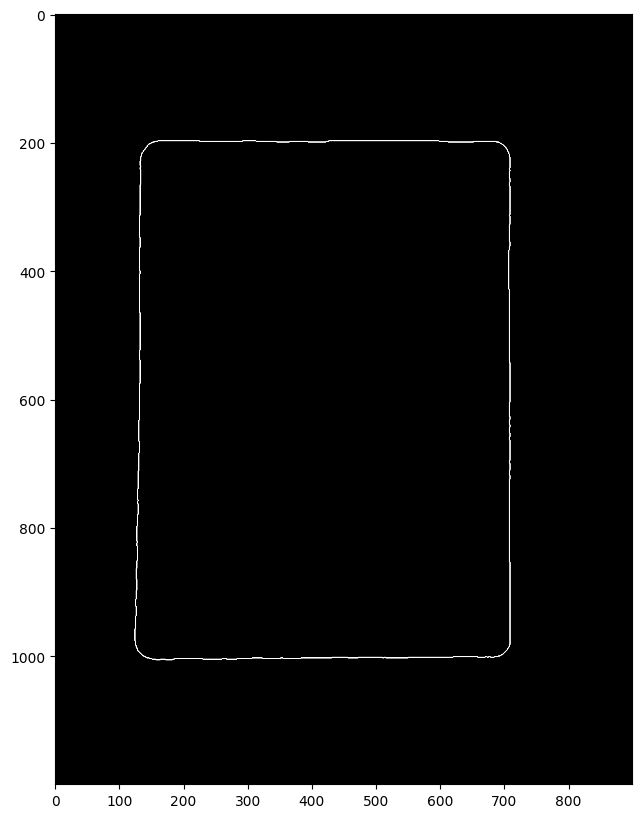

In [93]:
contour_image = np.zeros_like(img[:, :, 0])
cv2.drawContours(contour_image, [best_fit_contour], -1, (255), 1)
plt.figure(figsize=(10, 10))
plt.imshow(contour_image, cmap="grey", vmax=100)

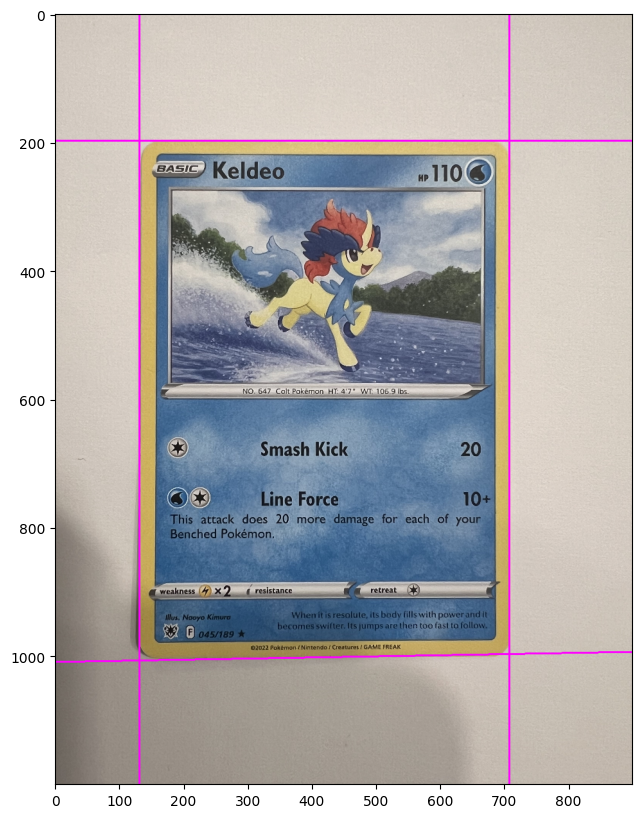

In [102]:
plt.figure(figsize=(10, 10))
draw.draw_lines(img, [new_lines[0], new_lines[1], new_lines[2], new_lines[4]])

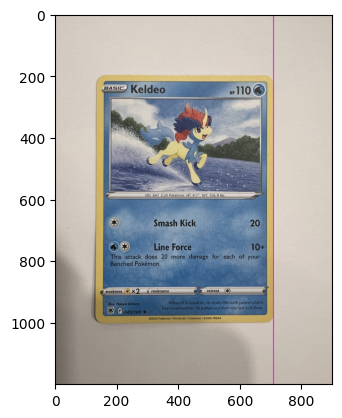

In [103]:
draw.draw_lines(img, [test_lines[0]])

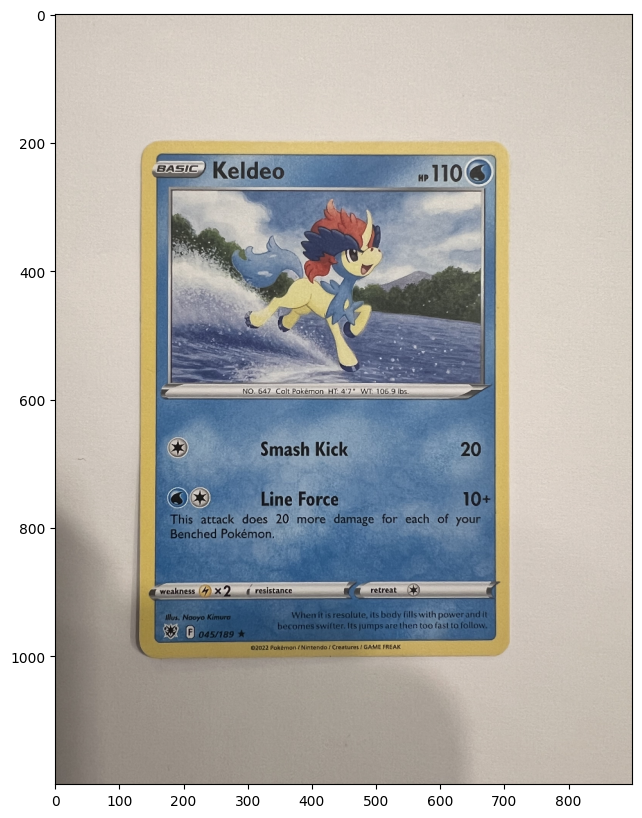

In [106]:
plt.figure(figsize=(10, 10))
draw.draw_lines(img, [avg_line])

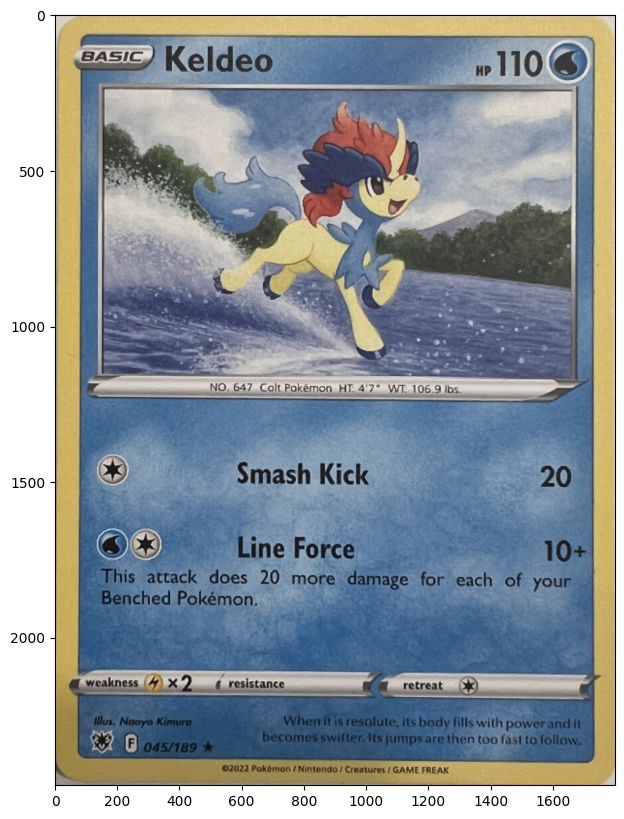

In [107]:
pts = deformer.get_corners_from_lines(new_lines, best_fit_contour)

# best_fit_contour = get_corners_from_contour(best_fit_contour)
# best_fit_contour = reset_orientation(best_fit_contour)

plt.figure(figsize=(10, 10))
plt.imshow(deformer.deform_img_to_card_from_pt(img, pts, IMG_SIZE, dst_shape=output_shape))